In [113]:
!pip install pandas matplotlib numpy statsforecast prophet scikit-learn scipy pyarrow seaborn xgboost h2o

You should consider upgrading via the '/Users/jorgensandhaug/Desktop/tdt4173/data/venv/bin/python3 -m pip install --upgrade pip' command.


In [114]:
import os
import pandas as pd
import numpy as np
import matplotlib.pylab as plt
%matplotlib inline

pd.set_option('display.max_rows', 200)
pd.set_option('display.max_columns', 200)

In [115]:
def list_directory_tree_with_os_walk(starting_directory):
    for root, directories, files in os.walk(starting_directory):
        print(f"Directory: {root}")
        for file in files:
            print(f"  File: {file}")

list_directory_tree_with_os_walk('.')

Directory: .
  File: darts.ipynb
  File: my_first_submission.csv
  File: sk_time_xgboost.ipynb
  File: darts_load_data.py
  File: sk_time.ipynb
  File: test.csv
  File: nhits_1.ipynb
  File: Readme.md
  File: sk_time.py
  File: .gitignore
  File: start_h2o.py
  File: X_train.csv
  File: output.png
  File: exploration_notes.md
  File: load_data.py
  File: X_test.csv
  File: sample_submission.csv
  File: read_files.ipynb
Directory: ./models
  File: xgb_model0.pkl
  File: xgb_model1.pkl
  File: xgb_model2.pkl
Directory: ./A
  File: X_train_estimated.csv
  File: X_train_observed.parquet
  File: train_targets.parquet
  File: X_train_observed.csv
  File: train_targets.csv
  File: X_test_estimated.csv
  File: X_train_estimated.parquet
  File: X_train.csv
  File: y_train.csv
  File: X_test.csv
  File: X_test_estimated.parquet
Directory: ./submissions
  File: submission_2.csv
  File: submission_1.csv
  File: submission_5.csv
  File: submission_7.csv
  File: submission_20.csv
  File: submission_

In [116]:
y_train_a = pd.read_parquet('A/train_targets.parquet')
y_train_b = pd.read_parquet('B/train_targets.parquet')
y_train_c = pd.read_parquet('C/train_targets.parquet')

In [117]:
y_train_a.describe()

,time,pv_measurement
count,34085,34085.000000
mean,2021-05-14 00:29:51.497726,630.594707
min,2019-06-02 22:00:00,0.000000
25%,2020-05-22 23:00:00,0.000000
50%,2021-05-13 00:00:00,5.940000
75%,2022-05-03 01:00:00,678.040000
max,2023-04-30 23:00:00,5733.420000
std,NaN,1165.902422


In [118]:
y_train_b.describe()


,time,pv_measurement
count,32848,32844.000000
mean,2020-12-07 17:46:02.031173,96.824778
min,2018-12-31 23:00:00,-0.000000
25%,2019-12-09 05:45:00,-0.000000
50%,2020-11-15 12:30:00,0.000000
75%,2021-10-23 17:15:00,96.600000
max,2023-04-30 23:00:00,1152.300000
std,NaN,193.946487


In [119]:
y_train_c.describe()

,time,pv_measurement
count,32155,26095.000000
mean,2020-11-20 18:02:22.186285,77.631060
min,2018-12-31 23:00:00,-0.000000
25%,2019-12-01 23:30:00,0.000000
50%,2020-11-01 00:00:00,0.000000
75%,2021-10-01 22:30:00,58.800000
max,2023-04-30 23:00:00,999.600000
std,NaN,165.816877


In [120]:
X_train_estimated_a = pd.read_parquet('A/X_train_estimated.parquet')
X_train_estimated_b = pd.read_parquet('B/X_train_estimated.parquet')
X_train_estimated_c = pd.read_parquet('C/X_train_estimated.parquet')


In [121]:
X_test_estimated_a = pd.read_parquet('A/X_test_estimated.parquet')
X_test_estimated_b = pd.read_parquet('B/X_test_estimated.parquet')
X_test_estimated_c = pd.read_parquet('C/X_test_estimated.parquet')


In [175]:
X_train_estimated_a["date_calc"].dt.hour.describe()

count    17576.000000
mean         7.797451
std          0.401911
min          7.000000
25%          8.000000
50%          8.000000
75%          8.000000
max          8.000000
Name: date_calc, dtype: float64

In [168]:
(X_train_estimated_a["date_forecast"]-X_train_estimated_a["date_calc"]).describe()

count                     17576
mean     1 days 04:04:36.966772
std      0 days 06:56:32.999378
min             0 days 15:57:04
25%             0 days 21:59:56
50%             1 days 03:59:56
75%             1 days 09:59:56
max             1 days 16:44:57
dtype: object

In [176]:

(X_test_estimated_a["date_forecast"]-X_test_estimated_a["date_calc"]).describe()

count                      2880
mean     1 days 04:52:09.300000
std      0 days 06:55:44.518168
min             0 days 16:58:37
25%             0 days 22:55:12
50%             1 days 04:51:47
75%             1 days 10:48:22
max             1 days 16:44:57
dtype: object

In [177]:
X_train_estimated_a.head()

,date_calc,date_forecast,absolute_humidity_2m:gm3,air_density_2m:kgm3,ceiling_height_agl:m,clear_sky_energy_1h:J,clear_sky_rad:W,cloud_base_agl:m,dew_or_rime:idx,dew_point_2m:K,diffuse_rad:W,diffuse_rad_1h:J,direct_rad:W,direct_rad_1h:J,effective_cloud_cover:p,elevation:m,fresh_snow_12h:cm,fresh_snow_1h:cm,fresh_snow_24h:cm,fresh_snow_3h:cm,fresh_snow_6h:cm,is_day:idx,is_in_shadow:idx,msl_pressure:hPa,precip_5min:mm,precip_type_5min:idx,pressure_100m:hPa,pressure_50m:hPa,prob_rime:p,rain_water:kgm2,relative_humidity_1000hPa:p,sfc_pressure:hPa,snow_density:kgm3,snow_depth:cm,snow_drift:idx,snow_melt_10min:mm,snow_water:kgm2,sun_azimuth:d,sun_elevation:d,super_cooled_liquid_water:kgm2,t_1000hPa:K,total_cloud_cover:p,visibility:m,wind_speed_10m:ms,wind_speed_u_10m:ms,wind_speed_v_10m:ms,wind_speed_w_1000hPa:ms
0,2022-10-27 07:00:18,2022-10-28 22:00:00,8.4,1.233,1425.099976,0.0,0.0,1211.699951,1.0,281.399994,0.0,0.0,0.0,0.0,100.0,6.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1001.099976,0.0,0.0,988.500000,994.500000,0.0,0.0,92.699997,1000.599976,NaN,0.0,0.0,-0.0,0.4,340.799011,-38.466999,0.0,284.700012,100.0,29429.699219,0.8,-0.4,0.7,-0.0
1,2022-10-27 07:00:18,2022-10-28 22:15:00,8.4,1.233,2085.899902,0.0,0.0,1560.500000,1.0,281.299988,0.0,0.0,0.0,0.0,100.0,6.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1000.799988,0.0,0.0,988.200012,994.200012,0.0,0.1,92.699997,1000.299988,NaN,0.0,0.0,-0.0,0.4,345.451996,-38.955002,0.0,284.700012,100.0,23604.099609,0.7,-0.4,0.7,-0.0
2,2022-10-27 07:00:18,2022-10-28 22:30:00,8.3,1.233,2746.600098,0.0,0.0,1909.400024,1.0,281.200012,0.0,0.0,0.0,0.0,100.0,6.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1000.400024,0.0,0.0,987.900024,993.900024,0.0,0.1,92.699997,1000.000000,NaN,0.0,0.0,-0.0,0.5,350.153015,-39.310001,0.0,284.700012,100.0,17799.800781,0.7,-0.3,0.6,-0.0
3,2022-10-27 07:00:18,2022-10-28 22:45:00,8.3,1.233,3407.399902,0.0,0.0,2258.199951,1.0,281.200012,0.0,0.0,0.0,0.0,100.0,6.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1000.099976,0.0,0.0,987.599976,993.599976,0.0,0.1,92.599998,999.700012,NaN,0.0,0.0,-0.0,0.6,354.886993,-39.528999,0.0,284.600006,100.0,12016.500000,0.6,-0.2,0.6,-0.0
4,2022-10-27 07:00:18,2022-10-28 23:00:00,8.2,1.233,4068.199951,0.0,0.0,2607.000000,1.0,281.100006,0.0,0.0,0.0,0.0,100.0,6.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,999.799988,0.0,0.0,987.299988,993.299988,0.0,0.1,92.599998,999.299988,NaN,0.0,0.0,-0.0,0.6,359.638000,-39.609001,0.0,284.600006,100.0,6254.399902,0.6,-0.1,0.6,-0.0


In [159]:
X_train_observed_a.describe()

,date_forecast,absolute_humidity_2m:gm3,air_density_2m:kgm3,ceiling_height_agl:m,clear_sky_energy_1h:J,clear_sky_rad:W,cloud_base_agl:m,dew_or_rime:idx,dew_point_2m:K,diffuse_rad:W,diffuse_rad_1h:J,direct_rad:W,direct_rad_1h:J,effective_cloud_cover:p,elevation:m,fresh_snow_12h:cm,fresh_snow_1h:cm,fresh_snow_24h:cm,fresh_snow_3h:cm,fresh_snow_6h:cm,is_day:idx,is_in_shadow:idx,msl_pressure:hPa,precip_5min:mm,precip_type_5min:idx,pressure_100m:hPa,pressure_50m:hPa,prob_rime:p,rain_water:kgm2,relative_humidity_1000hPa:p,sfc_pressure:hPa,snow_density:kgm3,snow_depth:cm,snow_drift:idx,snow_melt_10min:mm,snow_water:kgm2,sun_azimuth:d,sun_elevation:d,super_cooled_liquid_water:kgm2,t_1000hPa:K,total_cloud_cover:p,visibility:m,wind_speed_10m:ms,wind_speed_u_10m:ms,wind_speed_v_10m:ms,wind_speed_w_1000hPa:ms
count,118669,118669.000000,118669.000000,96422.000000,1.186690e+05,118669.000000,110603.000000,118669.000000,118669.000000,118669.000000,1.186690e+05,118669.000000,1.186690e+05,118669.000000,118669.0,118669.000000,118669.000000,118669.000000,118669.000000,118669.000000,118669.000000,118669.000000,118669.000000,118669.000000,118669.000000,118669.000000,118669.000000,118669.000000,118669.000000,118669.000000,118669.000000,2724.0,118669.000000,118669.0,118669.000000,118669.000000,118669.000000,118669.000000,118669.000000,118669.000000,118669.000000,118669.000000,118669.000000,118669.000000,118669.000000,118669.000000
mean,2021-02-09 23:30:00,6.652576,1.249064,2907.949219,5.994018e+05,166.500381,1737.142212,0.022398,276.823395,44.918282,1.617057e+05,56.611744,2.038025e+05,67.605507,6.0,0.053117,0.004418,0.106243,0.013277,0.026567,0.521391,0.511650,1009.632996,0.006302,0.091018,996.765381,1002.868225,0.187399,0.011914,74.231705,1008.998352,250.0,0.052763,0.0,0.000062,0.091566,179.629486,1.529545,0.059087,280.708557,74.401077,32446.992188,3.043197,0.756781,0.517437,0.000019
min,2019-06-02 22:00:00,0.700000,1.145000,27.799999,0.000000e+00,0.000000,27.900000,-1.000000,250.899994,0.000000,0.000000e+00,0.000000,0.000000e+00,0.000000,6.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,944.299988,0.000000,0.000000,932.299988,938.099976,0.000000,0.000000,22.700001,943.900024,250.0,0.000000,0.0,-0.000000,0.000000,0.002000,-50.004002,0.000000,258.899994,0.000000,154.300003,0.000000,-7.300000,-9.300000,-0.000000
25%,2020-04-06 22:45:00,4.400000,1.224000,1102.900024,0.000000e+00,0.000000,590.700012,0.000000,272.100006,0.000000,0.000000e+00,0.000000,0.000000e+00,43.299999,6.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1002.099976,0.000000,0.000000,989.299988,995.299988,0.000000,0.000000,65.000000,1001.400024,250.0,0.000000,0.0,0.000000,0.000000,88.487999,-15.066000,0.000000,275.899994,54.799999,15592.400391,1.700000,-1.400000,-0.700000,0.000000
50%,2021-02-09 23:30:00,6.300000,1.247000,1882.400024,3.574770e+04,8.600000,1162.599976,0.000000,277.200012,4.100000,2.481410e+04,0.000000,8.960000e+01,80.500000,6.0,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1010.700012,0.000000,0.000000,997.900024,1003.900024,0.000000,0.000000,76.699997,1010.000000,250.0,0.000000,0.0,0.000000,0.000000,179.436996,1.202000,0.000000,280.700012,93.699997,36359.800781,2.700000,0.400000,0.500000,0.000000
75%,2021-12-16 00:15:00,8.600000,1.272000,3969.750000,1.037819e+06,288.799988,2079.600098,0.000000,282.000000,76.000000,2.743256e+05,41.799999,1.598314e+05,98.800003,6.0,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1018.299988,0.000000,0.000000,1005.400024,1011.500000,0.000000,0.000000,85.400002,1017.599976,250.0,0.000000,0.0,0.000000,0.100000,270.640991,18.995001,0.100000,285.200012,99.900002,48084.500000,4.100000,2.700000,1.700000,0.000000
max,2022-10-21 01:00:00,17.500000,1.427000,12328.500000,3.005720e+06,836.400024,11688.700195,1.000000,293.799988,345.700012,1.205498e+06,688.700012,2.451173e+06,100.000000,6.0,15.100000,3.900000,15.100000,7.900000,14.800000,1.000000,1.000000,1044.000000,2.230000,6.000000,1

In [122]:
X_train_estimated_a.describe()

,date_calc,date_forecast,absolute_humidity_2m:gm3,air_density_2m:kgm3,ceiling_height_agl:m,clear_sky_energy_1h:J,clear_sky_rad:W,cloud_base_agl:m,dew_or_rime:idx,dew_point_2m:K,diffuse_rad:W,diffuse_rad_1h:J,direct_rad:W,direct_rad_1h:J,effective_cloud_cover:p,elevation:m,fresh_snow_12h:cm,fresh_snow_1h:cm,fresh_snow_24h:cm,fresh_snow_3h:cm,fresh_snow_6h:cm,is_day:idx,is_in_shadow:idx,msl_pressure:hPa,precip_5min:mm,precip_type_5min:idx,pressure_100m:hPa,pressure_50m:hPa,prob_rime:p,rain_water:kgm2,relative_humidity_1000hPa:p,sfc_pressure:hPa,snow_density:kgm3,snow_depth:cm,snow_drift:idx,snow_melt_10min:mm,snow_water:kgm2,sun_azimuth:d,sun_elevation:d,super_cooled_liquid_water:kgm2,t_1000hPa:K,total_cloud_cover:p,visibility:m,wind_speed_10m:ms,wind_speed_u_10m:ms,wind_speed_v_10m:ms,wind_speed_w_1000hPa:ms
count,17576,17576,17576.000000,17576.000000,13657.000000,1.757600e+04,17576.000000,15482.000000,17576.00000,17576.000000,17576.000000,1.757600e+04,17576.000000,1.757600e+04,17576.000000,17576.0,17576.000000,17576.000000,17576.000000,17576.000000,17576.000000,17576.000000,17576.000000,17576.000000,17576.000000,17576.000000,17576.000000,17576.000000,17576.000000,17576.000000,17576.000000,17576.000000,1807.0,17576.000000,17576.0,17576.000000,17576.000000,17576.000000,17576.000000,17576.000000,17576.000000,17576.000000,17576.000000,17576.000000,17576.000000,17576.000000,17576.0
mean,2023-01-27 19:07:13.160673,2023-01-28 23:11:50.127446,4.092438,1.281746,3257.459473,2.371263e+05,65.868149,1575.233032,0.00899,270.222351,22.836435,8.221085e+04,25.725431,9.261137e+04,68.346710,6.0,0.325085,0.027555,0.628334,0.083136,0.164838,0.349226,0.695380,1009.408142,0.004077,0.075956,996.317566,1002.565063,0.532237,0.003146,72.632843,1008.840332,250.0,0.213575,0.0,0.000570,0.077008,179.677383,-10.692363,0.032556,274.722656,73.760681,33458.078125,3.183540,-0.015197,0.926172,0.0
min,2022-10-27 07:00:18,2022-10-28 22:00:00,1.000000,1.212000,27.900000,0.000000e+00,0.000000,27.799999,-1.00000,254.699997,0.000000,0.000000e+00,0.000000,0.000000e+00,0.000000,6.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,970.700012,0.000000,0.000000,958.299988,964.200012,0.000000,0.000000,21.500000,970.099976,250.0,0.000000,0.0,-0.000000,0.000000,0.013000,-50.004002,0.000000,259.700012,0.000000,190.500000,0.100000,-7.200000,-5.300000,-0.0
25%,2022-12-12 08:00:05,2022-12-13 16:26:15,3.000000,1.262000,1185.500000,0.000000e+00,0.000000,497.524994,0.00000,266.799988,0.000000,0.000000e+00,0.000000,0.000000e+00,42.700001,6.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,999.099976,0.000000,0.000000,986.200012,992.400024,0.000000,0.000000,63.099998,998.599976,250.0,0.000000,0.0,-0.000000,0.000000,94.669249,-28.210751,0.000000,271.799988,49.099998,19838.000488,1.700000,-2.200000,-0.200000,-0.0
50%,2023-01-28 08:00:04,2023-01-29 10:52:30,3.900000,1.279000,2750.000000,0.000000e+00,0.000000,935.750000,0.00000,270.399994,0.000000,0.000000e+00,0.000000,0.000000e+00,84.300003,6.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1009.599976,0.000000,0.000000,996.400024,1002.700012,0.000000,0.000000,74.699997,1009.000000,250.0,0.000000,0.0,-0.000000,0.000000,179.510498,-9.930000,0.000000,274.700012,97.099998,34456.800781,2.900000,-0.300000,1.000000,-0.0
75%,2023-03-15 08:00:04,2023-03-16 05:18:45,5.100000,1.301000,4775.500000,1.374874e+05,37.400002,1919.599976,0.00000,273.899994,22.900000,8.024315e+04,0.800000,1.051160e+04,99.800003,6.0,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1019.599976,0.000000,0.000000,1006.299988,1012.599976,0.000000,0.000000,83.400002,1019.000000,250.0,0.000000,0.0,0.000000,0.100000,264.569756,4.489000,0.000000,277.799988,100.000000,47726.226562,4.300000,1.600000,2.000000,0.0
max,2023-04-29 07:00:05,2023-04-30 23:45:00,8.800000,1.374000,12307.700195,2.555980e+06,711.599976,10813.700195,1.00000,282.100006,300.500000,1.061123e+06,530.400024,1.893098e+06,100.000000,6.0,10.300000,3.500000,15.5

In [162]:
X_test_estimated_a.describe()

,date_calc,date_forecast,absolute_humidity_2m:gm3,air_density_2m:kgm3,ceiling_height_agl:m,clear_sky_energy_1h:J,clear_sky_rad:W,cloud_base_agl:m,dew_or_rime:idx,dew_point_2m:K,diffuse_rad:W,diffuse_rad_1h:J,direct_rad:W,direct_rad_1h:J,effective_cloud_cover:p,elevation:m,fresh_snow_12h:cm,fresh_snow_1h:cm,fresh_snow_24h:cm,fresh_snow_3h:cm,fresh_snow_6h:cm,is_day:idx,is_in_shadow:idx,msl_pressure:hPa,precip_5min:mm,precip_type_5min:idx,pressure_100m:hPa,pressure_50m:hPa,prob_rime:p,rain_water:kgm2,relative_humidity_1000hPa:p,sfc_pressure:hPa,snow_density:kgm3,snow_depth:cm,snow_drift:idx,snow_melt_10min:mm,snow_water:kgm2,sun_azimuth:d,sun_elevation:d,super_cooled_liquid_water:kgm2,t_1000hPa:K,total_cloud_cover:p,visibility:m,wind_speed_10m:ms,wind_speed_u_10m:ms,wind_speed_v_10m:ms,wind_speed_w_1000hPa:ms
count,2880,2880,2880.000000,2880.000000,2087.000000,2.880000e+03,2880.000000,2582.000000,2880.000000,2880.000000,2880.000000,2.880000e+03,2880.000000,2.880000e+03,2880.000000,2880.0,2880.000000,2880.000000,2880.000000,2880.000000,2880.000000,2880.000000,2880.000000,2880.000000,2880.000000,2880.000000,2880.000000,2880.000000,2880.0,2880.000000,2880.000000,2880.000000,0.0,2880.0,2880.0,2880.0,2880.000000,2880.000000,2880.000000,2880.000000,2880.000000,2880.000000,2880.000000,2880.000000,2880.000000,2880.000000,2880.0
mean,2023-06-04 17:24:20.700000,2023-06-05 22:16:30,8.205903,1.233150,3061.526611,1.227651e+06,341.014008,1866.812988,0.034722,280.800171,84.902321,3.056483e+05,114.781708,4.132130e+05,64.132294,6.0,0.000347,0.000174,0.000347,0.000347,0.000347,0.793750,0.225347,1016.797241,0.007476,0.063889,1003.811279,1009.852600,0.0,0.013333,70.750069,1015.920654,NaN,0.0,0.0,0.0,0.061146,179.181381,20.294441,0.063924,284.723358,69.309784,33599.617188,3.075139,1.739271,-0.218993,0.0
min,2023-04-30 07:00:04,2023-05-01 00:00:00,3.200000,1.151000,53.299999,0.000000e+00,0.000000,30.200001,0.000000,268.100006,0.000000,0.000000e+00,0.000000,0.000000e+00,0.000000,6.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,985.900024,0.000000,0.000000,973.700012,979.500000,0.0,0.000000,24.700001,985.299988,NaN,0.0,0.0,-0.0,0.000000,0.051000,-11.622000,0.000000,273.799988,0.000000,1649.900024,0.000000,-4.300000,-4.400000,-0.0
25%,2023-05-22 07:00:04,2023-05-23 11:56:15,6.700000,1.209000,954.099976,5.477638e+04,14.325000,509.100006,0.000000,278.000000,7.200000,3.283298e+04,0.000000,1.910500e+02,31.400000,6.0,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,1011.500000,0.000000,0.000000,998.400024,1004.475006,0.0,0.000000,60.299999,1010.500000,NaN,0.0,0.0,-0.0,0.000000,79.038752,2.047250,0.000000,279.799988,36.975000,19578.024414,1.600000,-0.300000,-1.300000,0.0
50%,2023-06-02 19:00:22,2023-06-03 23:52:30,8.100000,1.238500,1664.300049,1.046825e+06,290.500000,1048.000000,0.000000,281.100006,74.250000,2.682914e+05,13.650000,6.286620e+04,78.199997,6.0,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,1020.500000,0.000000,0.000000,1007.500000,1013.549988,0.0,0.000000,73.750000,1019.649994,NaN,0.0,0.0,0.0,0.000000,179.283005,19.290000,0.000000,284.799988,93.500000,37087.449219,2.900000,1.800000,-0.300000,0.0
75%,2023-06-18 07:00:05,2023-06-19 11:48:45,10.000000,1.260000,4082.700195,2.355269e+06,655.350006,2394.500000,0.000000,284.399994,133.750004,4.879698e+05,188.824997,6.650075e+05,100.000000,6.0,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,1023.799988,0.000000,0.000000,1010.900024,1017.000000,0.0,0.000000,83.300003,1023.099976,NaN,0.0,0.0,0.0,0.000000,279.788490,38.294751,0.100000,288.200012,100.000000,46180.325195,4.200000,3.800000,0.700000,0.0
max,2023-07-02 07:00:31,2023-07-03 23:45:00,13.800000,1.300000,11443.900391,3.005375e+06,836.299988,11256.700195,1.000000,289.700012,321.899994,1.116314e+06,668.400024,2.402522e+06,100.000000,6.0,0.500000,0.500000,0.500000,0.500000,0.500000,1.000000,1.000000,1029.599976,0.330000,1.000000,1016.400024,1022.500000,0.0,0.700000,98.099998,1028.699951,NaN

In [124]:
X_train_estimated_c.describe()

,date_calc,date_forecast,absolute_humidity_2m:gm3,air_density_2m:kgm3,ceiling_height_agl:m,clear_sky_energy_1h:J,clear_sky_rad:W,cloud_base_agl:m,dew_or_rime:idx,dew_point_2m:K,diffuse_rad:W,diffuse_rad_1h:J,direct_rad:W,direct_rad_1h:J,effective_cloud_cover:p,elevation:m,fresh_snow_12h:cm,fresh_snow_1h:cm,fresh_snow_24h:cm,fresh_snow_3h:cm,fresh_snow_6h:cm,is_day:idx,is_in_shadow:idx,msl_pressure:hPa,precip_5min:mm,precip_type_5min:idx,pressure_100m:hPa,pressure_50m:hPa,prob_rime:p,rain_water:kgm2,relative_humidity_1000hPa:p,sfc_pressure:hPa,snow_density:kgm3,snow_depth:cm,snow_drift:idx,snow_melt_10min:mm,snow_water:kgm2,sun_azimuth:d,sun_elevation:d,super_cooled_liquid_water:kgm2,t_1000hPa:K,total_cloud_cover:p,visibility:m,wind_speed_10m:ms,wind_speed_u_10m:ms,wind_speed_v_10m:ms,wind_speed_w_1000hPa:ms
count,17576,17576,17576.000000,17576.000000,12980.000000,1.757600e+04,17576.000000,14772.000000,17576.000000,17576.000000,17576.000000,1.757600e+04,17576.000000,1.757600e+04,17576.000000,17576.0,17576.000000,17576.000000,17576.000000,17576.000000,17576.000000,17576.000000,17576.000000,17576.000000,17576.000000,17576.000000,17576.000000,17576.000000,17576.000000,17576.000000,17576.000000,17576.000000,3678.0,17576.000000,17576.0,17576.000000,17576.000000,17576.000000,17576.000000,17576.000000,17576.000000,17576.000000,17576.000000,17576.000000,17576.000000,17576.000000,17576.000000
mean,2023-01-27 19:07:13.160673,2023-01-28 23:11:50.127446,3.927350,1.281578,3403.212646,2.376466e+05,66.013062,1738.442749,-0.093707,269.505615,23.372576,8.414221e+04,25.439896,9.158342e+04,67.135956,24.0,0.601502,0.049681,1.158028,0.148942,0.298333,0.349454,0.740669,1009.395630,0.004569,0.090066,993.689453,999.935730,3.535383,0.002970,72.576851,1006.210083,250.0,0.812307,0.0,0.001245,0.075586,179.674271,-10.690556,0.033546,274.769897,72.695808,34643.558594,2.917200,0.150148,1.320397,-0.000762
min,2022-10-27 07:00:18,2022-10-28 22:00:00,0.800000,1.207000,27.600000,0.000000e+00,0.000000,27.299999,-1.000000,251.899994,0.000000,0.000000e+00,0.000000,0.000000e+00,0.000000,24.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,970.599976,0.000000,0.000000,955.700012,961.599976,0.000000,0.000000,21.100000,967.599976,250.0,0.000000,0.0,-0.000000,0.000000,0.009000,-50.042000,0.000000,259.500000,0.000000,160.199997,0.000000,-6.400000,-5.000000,-0.100000
25%,2022-12-12 08:00:05,2022-12-13 16:26:15,2.800000,1.261000,1266.375000,0.000000e+00,0.000000,515.275024,0.000000,265.899994,0.000000,0.000000e+00,0.000000,0.000000e+00,37.875001,24.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,999.099976,0.000000,0.000000,983.500000,989.774994,0.000000,0.000000,62.599998,996.000000,250.0,0.000000,0.0,-0.000000,0.000000,94.672752,-28.220250,0.000000,271.899994,46.375001,20512.024902,1.700000,-1.500000,0.300000,0.000000
50%,2023-01-28 08:00:04,2023-01-29 10:52:30,3.800000,1.278000,2871.149902,0.000000e+00,0.000000,989.049988,0.000000,269.899994,0.000000,0.000000e+00,0.000000,0.000000e+00,84.599998,24.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1009.599976,0.000000,0.000000,993.799988,1000.099976,0.000000,0.000000,74.500000,1006.400024,250.0,0.000000,0.0,-0.000000,0.000000,179.507996,-9.919500,0.000000,274.700012,97.400002,36348.650391,2.600000,-0.100000,1.300000,0.000000
75%,2023-03-15 08:00:04,2023-03-16 05:18:45,4.900000,1.301000,4948.549805,1.388008e+05,37.799999,2067.024902,0.000000,273.600006,23.299999,8.177455e+04,0.000000,2.711800e+03,99.900002,24.0,0.000000,0.000000,0.800000,0.000000,0.000000,1.000000,1.000000,1019.400024,0.000000,0.000000,1003.599976,1009.900024,0.000000,0.000000,83.699997,1016.299988,250.0,0.000000,0.0,0.000000,0.100000,264.561249,4.516000,0.000000,277.899994,100.000000,49470.349609,3.900000,1.200000,2.400000,0.000000
max,2023-04-29 07:00:05,2023-04-30 23:45:00,8.900000,1.384000,12115.400391,2.558352e+06,712.299988,10725.599609,1.000000,282.399994,319.000000,1.111721e+06,531.400024,1.897313e+06

In [125]:
X_train_observed_a = pd.read_parquet('A/X_train_observed.parquet')
X_train_observed_b = pd.read_parquet('B/X_train_observed.parquet')
X_train_observed_c = pd.read_parquet('C/X_train_observed.parquet')

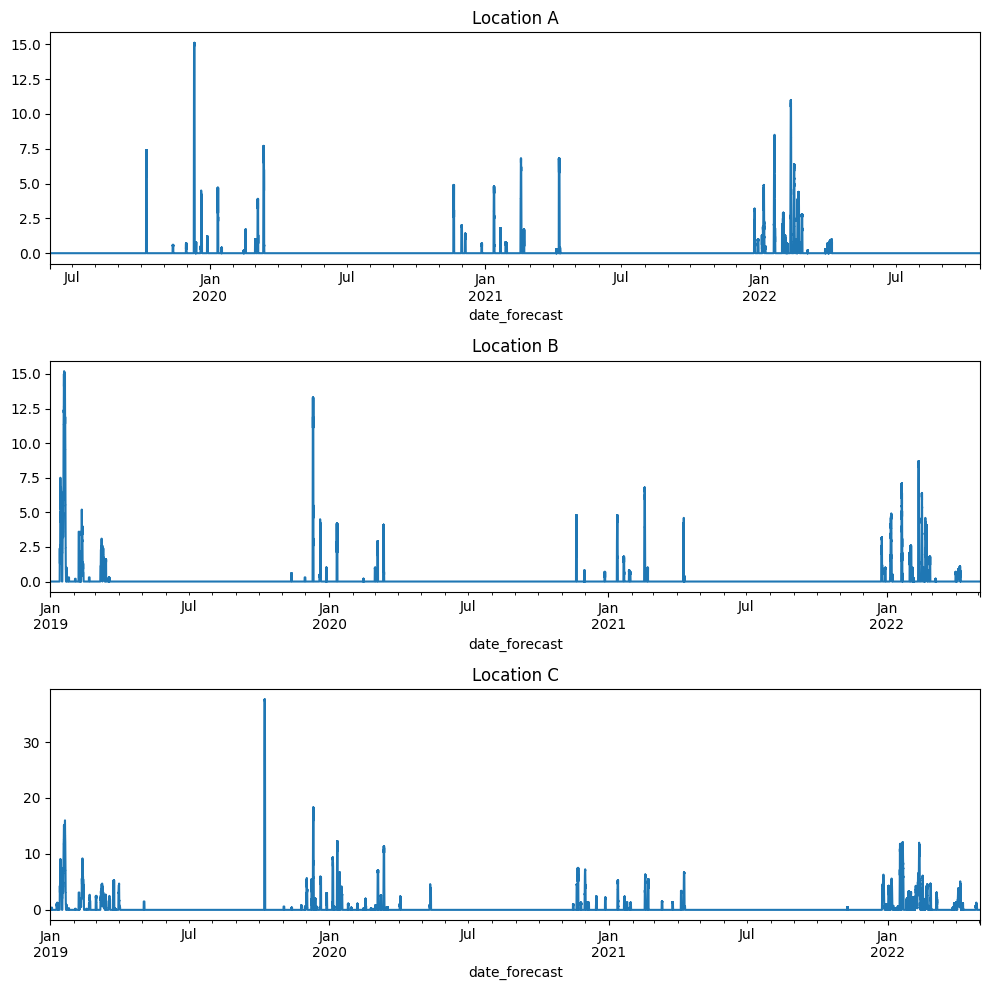

In [151]:
fig, axs = plt.subplots(3, 1, figsize=(10, 10))

X_train_observed_a.set_index("date_forecast")["fresh_snow_24h:cm"].plot(ax=axs[0])
axs[0].set_title('Location A')

X_train_observed_b.set_index("date_forecast")["fresh_snow_24h:cm"].plot(ax=axs[1])
axs[1].set_title('Location B')

X_train_observed_c.set_index("date_forecast")["fresh_snow_24h:cm"].plot(ax=axs[2])
axs[2].set_title('Location C')

plt.tight_layout()
plt.show()


<Axes: title={'center': 'Train/Test  C'}, xlabel='date_forecast'>

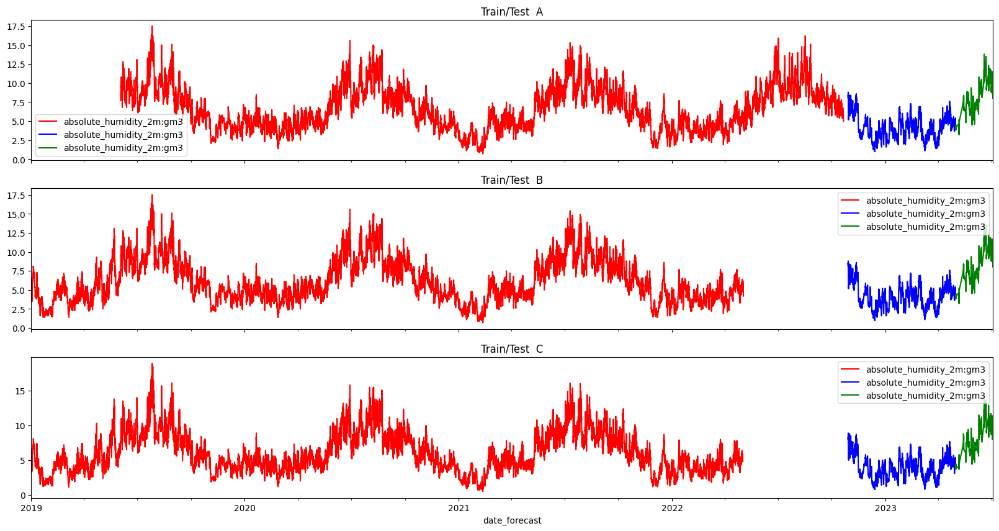

In [127]:
# Plotting a single feature
fig, axs = plt.subplots(3, 1, figsize=(20, 10), sharex=True)
feature_name = 'absolute_humidity_2m:gm3'
X_train_observed_a[['date_forecast', feature_name]].set_index('date_forecast').plot(ax=axs[0], title='Train/Test A', color='red')
X_train_estimated_a[['date_forecast', feature_name]].set_index('date_forecast').plot(ax=axs[0], title='Train/Test A', color='blue')
X_test_estimated_a[['date_forecast', feature_name]].set_index('date_forecast').plot(ax=axs[0], title='Train/Test  A', color='green')

X_train_observed_b[['date_forecast', feature_name]].set_index('date_forecast').plot(ax=axs[1], title='Train/Test  B', color='red')
X_train_estimated_b[['date_forecast', feature_name]].set_index('date_forecast').plot(ax=axs[1], title='Train/Test  B', color='blue')
X_test_estimated_b[['date_forecast', feature_name]].set_index('date_forecast').plot(ax=axs[1], title='Train/Test  B', color='green')

X_train_observed_c[['date_forecast', feature_name]].set_index('date_forecast').plot(ax=axs[2], title='Train/Test  C', color='red')
X_train_estimated_c[['date_forecast', feature_name]].set_index('date_forecast').plot(ax=axs[2], title='Train/Test  C', color='blue')
X_test_estimated_c[['date_forecast', feature_name]].set_index('date_forecast').plot(ax=axs[2], title='Train/Test  C', color='green')

In [128]:
# # Example, let the predictions be random values
# test['prediction'] = np.random.rand(len(test))
# sample_submission = sample_submission[['id']].merge(test[['id', 'prediction']], on='id', how='left')
# sample_submission.to_csv('my_first_submission.csv', index=False)

# Exploratory analysis of the data

In [129]:
data_by_location = {
    'A': {
        'y_train': y_train_a,
        'X_train_estimated': X_train_estimated_a,
        'X_train_observed': X_train_observed_a,
        'X_test_estimated': X_test_estimated_a
    },
    'B': {
        'y_train': y_train_b,
        'X_train_estimated': X_train_estimated_b,
        'X_train_observed': X_train_observed_b,
        'X_test_estimated': X_test_estimated_b
    },
    'C': {
        'y_train': y_train_c,
        'X_train_estimated': X_train_estimated_c,
        'X_train_observed': X_train_observed_c,
        'X_test_estimated': X_test_estimated_c
    }
}


In [130]:
# Importing additional libraries for data exploration
import matplotlib.pyplot as plt
import seaborn as sns

# Step 1: Check Data Types and Missing Values
data_types_missing = {location: {key: df.dtypes.to_frame(name='Data Type').join(df.isnull().sum().to_frame(name='Missing Values')) for key, df in data_frames.items()} for location, data_frames in data_by_location.items()}

/Users/jorgensandhaug/Desktop/tdt4173/data/venv/lib/python3.9/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/jorgensandhaug/Desktop/tdt4173/data/venv/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/Users/jorgensandhaug/Desktop/tdt4173/data/venv/lib/python3.9/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/jorgensandhaug/Desktop/tdt4173/data/venv/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_in

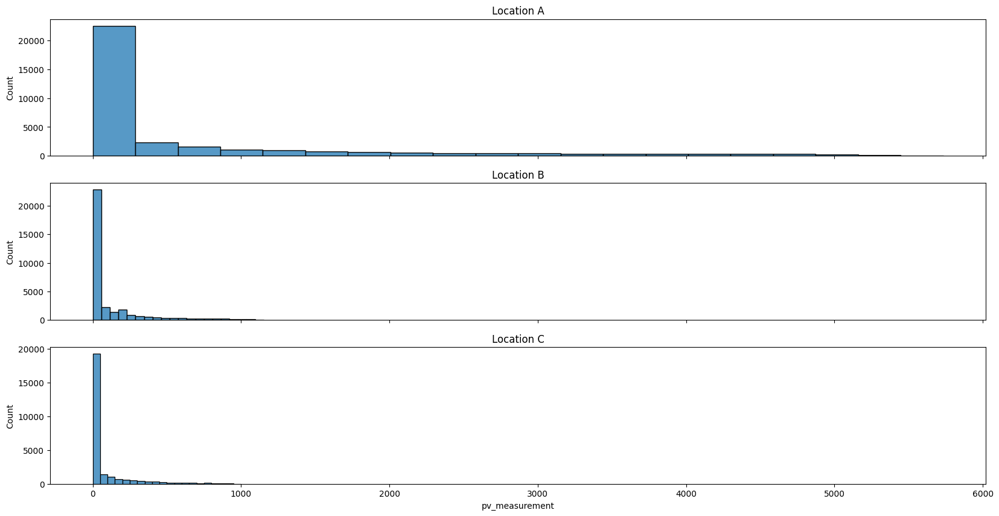

In [131]:
import seaborn as sns
import matplotlib.pyplot as plt

fig, axs = plt.subplots(3, 1, figsize=(20, 10), sharex=True)

for i, location in enumerate(['A', 'B', 'C']):
    sns.histplot(data=data_by_location[location]['y_train'], x='pv_measurement', bins=20, ax=axs[i])
    axs[i].set_title(f'Location {location}')


In [132]:
# Step 1: Convert Time Columns to Datetime
# Converting the 'time' and 'date_forecast' columns to datetime objects will make it easier to handle time-based operations.
# It will allow for easy filtering, resampling, and time-based plotting.
for location, data_frames in data_by_location.items():
    for key, df in data_frames.items():
        if 'time' in df.columns:
            df['time'] = pd.to_datetime(df['time'])
        if 'date_forecast' in df.columns:
            df['date_forecast'] = pd.to_datetime(df['date_forecast'])

# # Step 2: Create 'hour' and 'day_of_week' and 'month' Columns
# for location, data_frames in data_by_location.items():
#     for key, df in data_frames.items():
#         if 'time' in df.columns:
#             df['hour'] = df['time'].dt.hour
#             df['day_of_week'] = df['time'].dt.dayofweek
#             df['month'] = df['time'].dt.month


In [133]:
# merge the dataframes for each location into a single dataframe (y_train, X_train_estimated, X_train_observed) into a single dataframe
#data_by_location_merged = {location: pd.merge(data_frames['y_train'], data_frames['X_train_estimated'], on=['id', 'time'], how='left').merge(data_frames['X_train_observed'], on=['id', 'time'], how='left') for location, data_frames in data_by_location.items()}


In [134]:
# # Step 2: Handle Missing Values - For now, we'll fill missing values with the median of each column
# # This is a simple imputation strategy; more advanced methods can be explored later
# for location, data_frames in data_by_location.items():
#     for key, df in data_frames.items():
#         #df.fillna(df.median(), inplace=True)
#         df.dropna(inplace=True)

In [135]:
# Step 3: Feature Correlation
# Checking the correlation between features and the target variable can provide insights into which features 
# are most relevant for predicting solar energy production.

# for location, data_frames in data_by_location.items():
#     for key, df in data_frames.items():
#         if key == 'y_train':
#             continue
#         print(f'Location: {location}, Data Frame: {key}')
#         df_corr = df.corr()
#         fig, ax = plt.subplots(figsize=(20, 20))
#         sns.heatmap(df_corr, annot=True, ax=ax)
#         plt.show()





In [136]:
train_targets=data_by_location['A']['y_train']
train_targets

,time,pv_measurement
0,2019-06-02 22:00:00,0.00
1,2019-06-02 23:00:00,0.00
2,2019-06-03 00:00:00,0.00
3,2019-06-03 01:00:00,0.00
4,2019-06-03 02:00:00,19.36
...,...,...
34080,2023-04-30 19:00:00,9.02
34081,2023-04-30 20:00:00,0.00
34082,2023-04-30 21:00:00,0.00
34083,2023-04-30 22:00:00,0.00


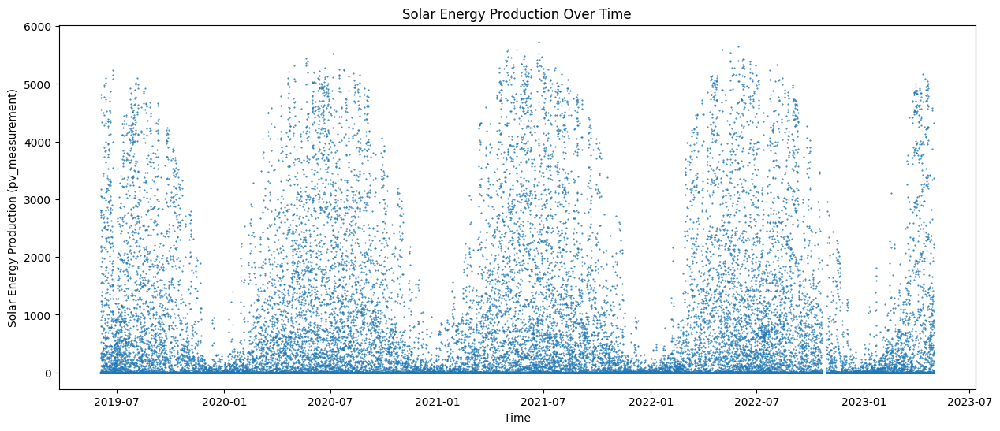

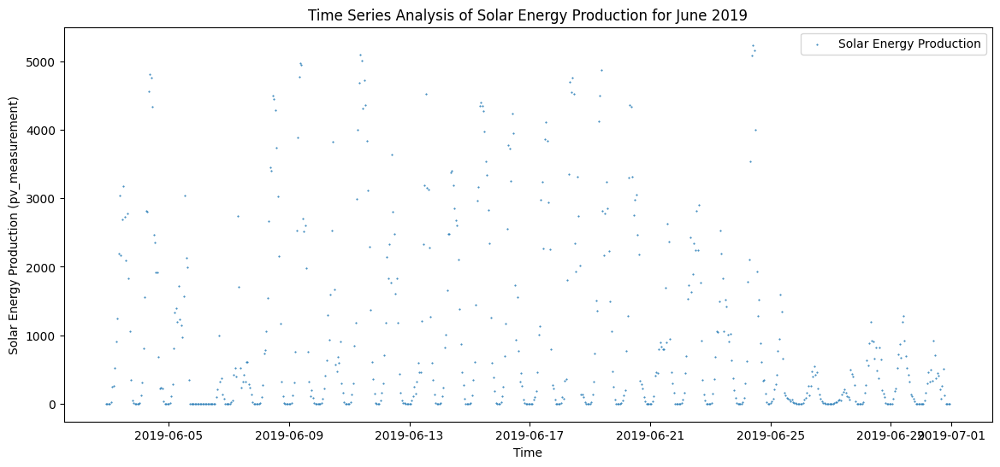

In [137]:


# Step 4: Time Series Analysis - Plotting the target variable over time to explore any temporal patterns
plt.figure(figsize=(15, 6))
size = 1
plt.scatter(train_targets['time'], train_targets['pv_measurement'], marker='.', s=size)
plt.title('Solar Energy Production Over Time')
plt.xlabel('Time')
plt.ylabel('Solar Energy Production (pv_measurement)')
plt.show()


# Plotting the time series data for 'pv_measurement' for a sample period (one month)
sample_data = train_targets.set_index('time')['2019-06-01':'2019-06-30']


plt.figure(figsize=(14, 6))
plt.scatter(sample_data.index, sample_data['pv_measurement'], label='Solar Energy Production', marker=".", s=size)
plt.xlabel('Time')
plt.ylabel('Solar Energy Production (pv_measurement)')
plt.title('Time Series Analysis of Solar Energy Production for June 2019')
plt.legend()
plt.show()


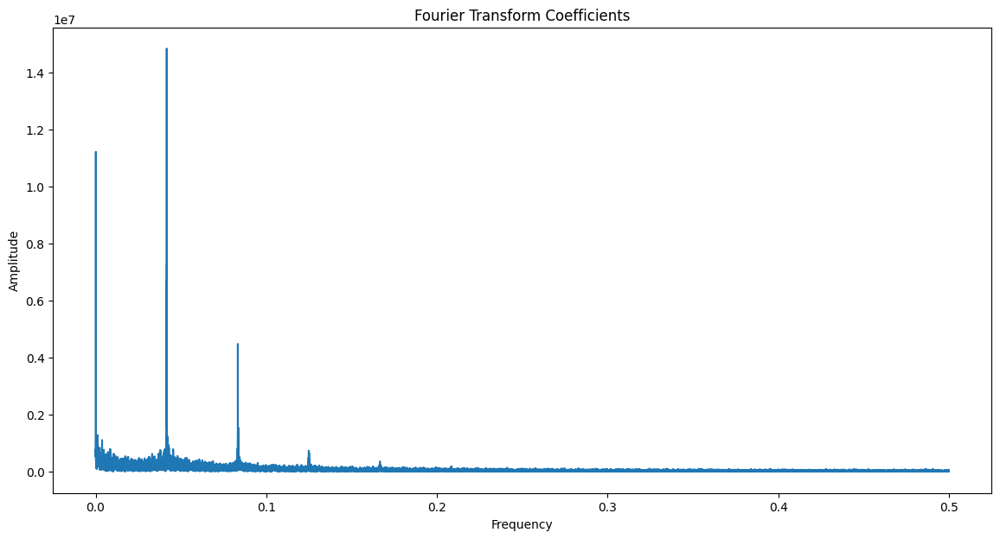

[0.08332111 0.0415432  0.04177791 0.00011735 0.04166055]


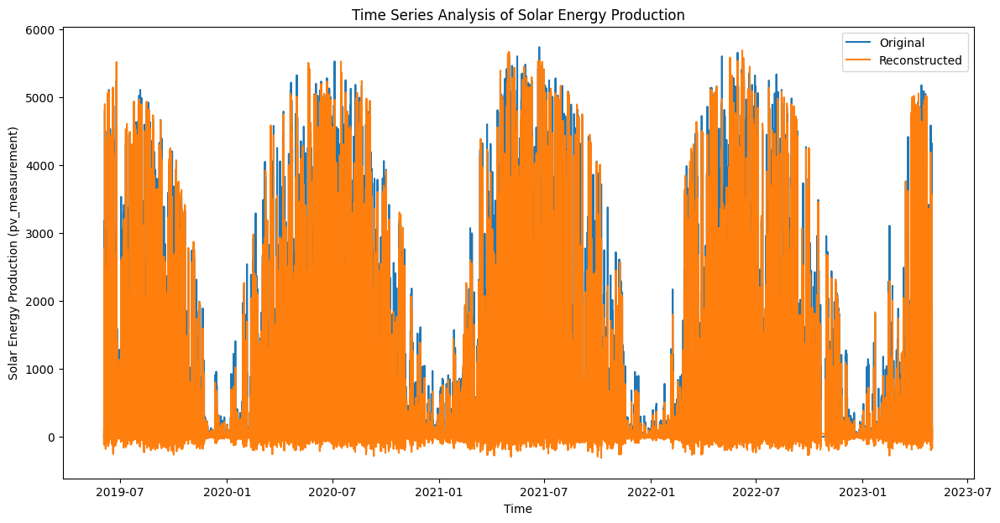

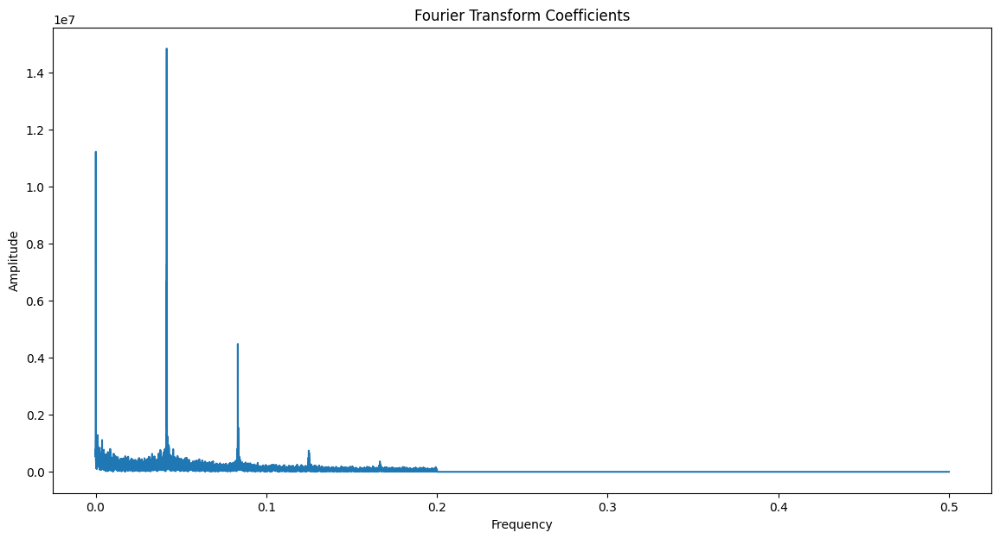

In [138]:
import numpy as np
from scipy.fft import fft

# Fourier Transform
# We'll use the target variable 'pv_measurement' for this analysis.
# For better results, the data should be evenly sampled and cover at least one full period (e.g., one day or one year).

# Converting the Pandas Series to a NumPy array before applying the Fourier Transform
fourier_transform = fft(train_targets['pv_measurement'].dropna().to_numpy())

# Frequencies corresponding to Fourier Transform Coefficients
frequencies = np.fft.fftfreq(len(fourier_transform))

# find where the positive frequency values are located in the frequencies array
positive_frequencies = frequencies > 0



# Plotting the first few Fourier Coefficients to observe any strong frequencies
plt.figure(figsize=(14, 7))
plt.plot(frequencies[positive_frequencies], np.abs(fourier_transform[positive_frequencies]))
plt.title('Fourier Transform Coefficients')
plt.xlabel('Frequency')
plt.ylabel('Amplitude')
plt.show()

# locate those frequencies with the highest amplitudes
highest_amplitude_frequencies = np.argsort(np.abs(fourier_transform[positive_frequencies]))[-5:]

# print the frequencies with the highest amplitudes
print(frequencies[positive_frequencies][highest_amplitude_frequencies])

# remove the highest amplitude frequencies, then apply the inverse Fourier Transform, use all frequencies withing error range of the highest amplitude frequency
fourier_transform_filtered = fourier_transform.copy()
fourier_transform_filtered[np.abs(frequencies) > 0.2] = 0
inverse_fourier_transform = np.real(np.fft.ifft(fourier_transform_filtered))


# Plotting the original time series data and the reconstructed time series data
plt.figure(figsize=(14, 7))
plt.plot(train_targets['time'], train_targets['pv_measurement'], label='Original')
plt.plot(train_targets['time'], inverse_fourier_transform, label='Reconstructed')
plt.xlabel('Time')
plt.ylabel('Solar Energy Production (pv_measurement)')
plt.title('Time Series Analysis of Solar Energy Production')
plt.legend()
plt.show()


# lets double check by plotting the fourier transform of the reconstructed time series data
fourier_transform = fft(inverse_fourier_transform)
plt.figure(figsize=(14, 7))
plt.plot(frequencies[positive_frequencies], np.abs(fourier_transform[positive_frequencies]))
plt.title('Fourier Transform Coefficients')
plt.xlabel('Frequency')
plt.ylabel('Amplitude')
plt.show()





# Lets try a model

In [143]:
merged_train_data = X_train_observed_a.copy()
print(merged_train_data.shape, y_train_a.shape)
# Creating new combined features based on the discussion
merged_train_data['direct_rad_temp'] = merged_train_data['direct_rad:W'] * merged_train_data['t_1000hPa:K']
merged_train_data['rad_cloud_cover'] = merged_train_data['direct_rad:W'] * (1 - merged_train_data['total_cloud_cover:p'])
merged_train_data['sun_elevation_azimuth'] = merged_train_data['sun_elevation:d'] * merged_train_data['sun_azimuth:d']
merged_train_data['direct_rad_sun_elevation'] = merged_train_data['direct_rad:W'] * merged_train_data['sun_elevation:d']
merged_train_data['temp_wind_speed'] = merged_train_data['t_1000hPa:K'] * merged_train_data['wind_speed_v_10m:ms']
merged_train_data['is_day_is_in_shadow'] = merged_train_data['is_day:idx'] * (1 - merged_train_data['is_in_shadow:idx'])

# Calculate the new correlation matrix
new_correlation_matrix = merged_train_data.corr()

# Extract the correlations between the new features and the target variable 'pv_measurement'
new_feature_target_corr = new_correlation_matrix['pv_measurement'][['direct_rad_temp', 'rad_cloud_cover', 'sun_elevation_azimuth', 
                                                                   'direct_rad_sun_elevation', 'temp_wind_speed', 'is_day_is_in_shadow']]

new_feature_target_corr

(118669, 46) (34085, 2)


KeyError: 'pv_measurement'

MAE: 223.95842094156976


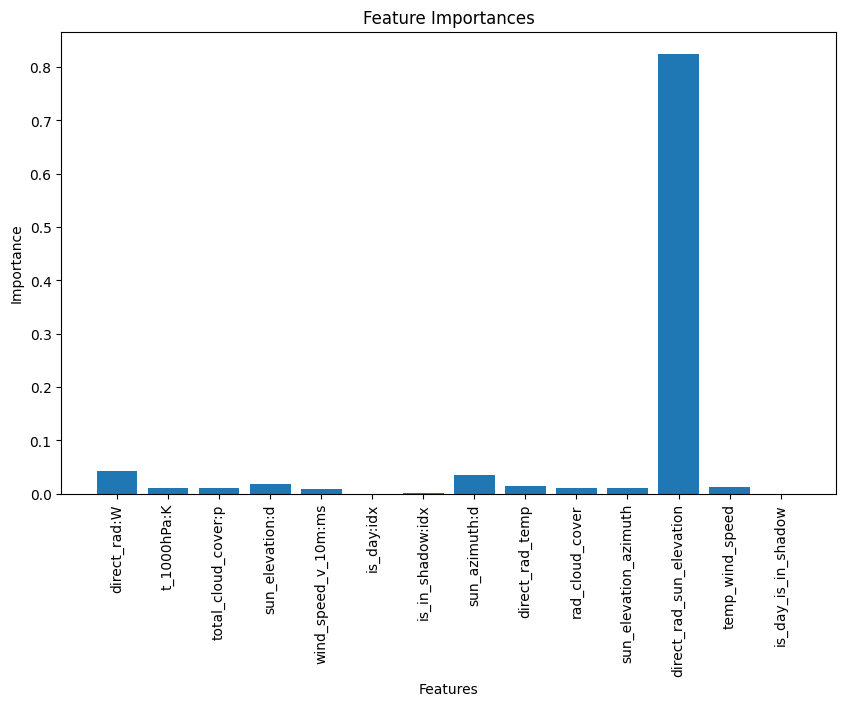

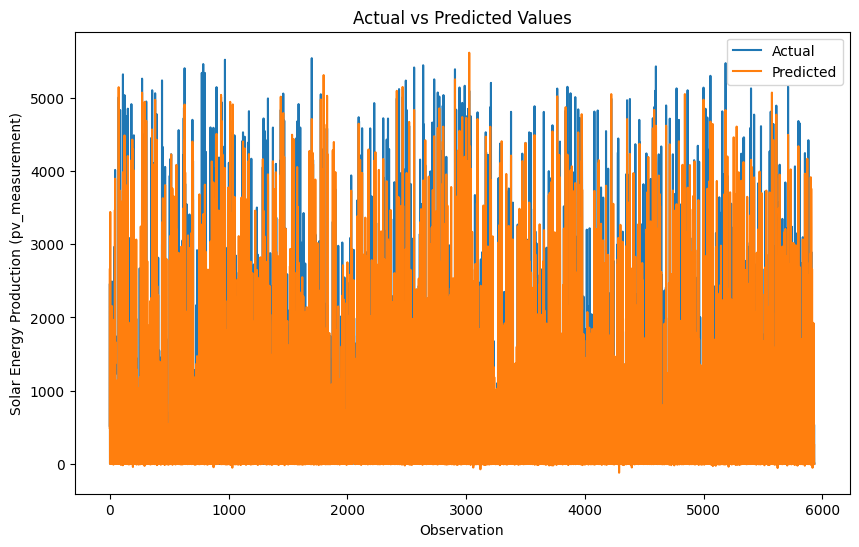

In [ ]:
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from xgboost import XGBRegressor
import pandas as pd
import numpy as np


# Replace this with actual DataFrame loading if needed

# Features and target to keep
features_to_keep = ['direct_rad:W', 't_1000hPa:K', 'total_cloud_cover:p', 'sun_elevation:d', 'wind_speed_v_10m:ms', 
                    'is_day:idx', 'is_in_shadow:idx', 'sun_azimuth:d',
                    'direct_rad_temp', 'rad_cloud_cover', 'sun_elevation_azimuth', 
                    'direct_rad_sun_elevation', 'temp_wind_speed', 'is_day_is_in_shadow']
target = 'pv_measurement'

# Filter the merged data
filtered_data = merged_train_data[[target] + features_to_keep]

# Drop rows with NaN values for simplicity
filtered_data.dropna(inplace=True)

# Split the data
X = filtered_data.drop(columns=[target])
y = filtered_data[target]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize scalers
standard_scaler = StandardScaler()
minmax_scaler = MinMaxScaler()

# Apply different scalers to different feature subsets
# Standardization for weather features
features_for_standardization = ['direct_rad:W', 't_1000hPa:K', 'total_cloud_cover:p', 'sun_elevation:d', 'wind_speed_v_10m:ms',
                                'direct_rad_temp', 'rad_cloud_cover', 'sun_elevation_azimuth', 
                                'direct_rad_sun_elevation', 'temp_wind_speed']

# Min-Max scaling for time-based features
features_for_minmax = ['is_day:idx', 'is_in_shadow:idx', 'sun_azimuth:d', 'is_day_is_in_shadow']

# Apply scaling
X_train[features_for_standardization] = standard_scaler.fit_transform(X_train[features_for_standardization])
X_test[features_for_standardization] = standard_scaler.transform(X_test[features_for_standardization])

X_train[features_for_minmax] = minmax_scaler.fit_transform(X_train[features_for_minmax])
X_test[features_for_minmax] = minmax_scaler.transform(X_test[features_for_minmax])

# Initialize the XGBoost Regressor model
xgb_model = XGBRegressor(objective='reg:linear', random_state=42)



# Train the model
xgb_model.fit(X_train, y_train)

# Make predictions on the test set
y_pred = xgb_model.predict(X_test)

from sklearn.metrics import mean_absolute_error

# Evaluate the model using MAE (Mean Absolute Error)
mae = mean_absolute_error(y_test, y_pred)
print(f"MAE: {mae}")


# Plotting the feature importances
plt.figure(figsize=(10, 6))
plt.bar(X_train.columns, xgb_model.feature_importances_)
plt.title('Feature Importances')
plt.xlabel('Features')
plt.ylabel('Importance')
plt.xticks(rotation=90)
plt.show()


# plot the actual vs predicted values
plt.figure(figsize=(10, 6))
plt.plot(y_test.values, label='Actual')
plt.plot(y_pred, label='Predicted')
plt.title('Actual vs Predicted Values')
plt.xlabel('Observation')
plt.ylabel('Solar Energy Production (pv_measurement)')
plt.legend()
plt.show()






In [ ]:
import h2o
from h2o.automl import H2OAutoML

# Initialize H2O cluster
h2o.init()

# Convert pandas DataFrame to H2O Frame
h2o_train = h2o.H2OFrame(X_train)
h2o_test = h2o.H2OFrame(X_test)
h2o_train[target] = h2o.H2OFrame(y_train.to_frame())
h2o_test[target] = h2o.H2OFrame(y_test.to_frame())

# Identify predictors and target
predictors = features_to_keep
response = target

# Run AutoML for 20 base models (limited to 1 hour max runtime by default)
# Exclude other algorithms to only include GBM and XRT
aml = H2OAutoML(
    max_models=20,
    seed=42,
    exclude_algos=["DeepLearning", "GLM", "DRF", "StackedEnsemble"],
    stopping_metric='MAE',
    sort_metric='MAE'
)

aml.train(x=predictors, y=response, training_frame=h2o_train)

# View the AutoML Leaderboard
lb = aml.leaderboard
print(lb.head(rows=lb.nrows))

# Make predictions
preds = aml.predict(h2o_test)

# Convert to pandas DataFrame for further analysis
preds_df = h2o.as_list(preds)

# Shutdown H2O cluster
#h2o.cluster().shutdown()


Checking whether there is an H2O instance running at http://localhost:54321. connected.


H2O_cluster_uptime:,6 mins 02 secs
H2O_cluster_timezone:,Europe/Oslo
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.42.0.3
H2O_cluster_version_age:,1 month
H2O_cluster_name:,H2O_from_python_jorgensandhaug_or0she
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,3.998 Gb
H2O_cluster_total_cores:,8
H2O_cluster_allowed_cores:,8
H2O_cluster_status:,"locked, healthy"


Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
AutoML progress: |
14:58:49.281: AutoML: XGBoost is not available; skipping it.

███████████████████████████████████████████████████████████████| (done) 100%
model_id                                          mae     rmse     mse    rmsle    mean_residual_deviance
GBM_grid_1_AutoML_1_20230923_145849_model_12  224.254  482.326  232639      nan                    232639
GBM_grid_1_AutoML_1_20230923_145849_model_5   224.302  486.555  236736      nan                    236736
GBM_3_AutoML_1_20230923_145849                224.459  485.468  235680      nan                    235680
GBM_4_AutoML_1_20230923_145849        

In [ ]:
models = h2o.ls().key
print(models)

0     AutoMLSession_AutoML_1_20230923_145849@@pv_mea...
1              AutoML_1_20230923_145849@@pv_measurement
2                     AutoML_1_20230923_145849_eventlog
3                  AutoML_1_20230923_145849_leaderboard
4       AutoML_1_20230923_145849_training_py_8_sid_8793
5       Events_AutoML_1_20230923_145849@@pv_measurement
6                        GBM_1_AutoML_1_20230923_145849
7                        GBM_2_AutoML_1_20230923_145849
8                        GBM_3_AutoML_1_20230923_145849
9                        GBM_4_AutoML_1_20230923_145849
10                       GBM_5_AutoML_1_20230923_145849
11                  GBM_grid_1_AutoML_1_20230923_145849
12          GBM_grid_1_AutoML_1_20230923_145849_model_1
13         GBM_grid_1_AutoML_1_20230923_145849_model_10
14         GBM_grid_1_AutoML_1_20230923_145849_model_11
15         GBM_grid_1_AutoML_1_20230923_145849_model_12
16         GBM_grid_1_AutoML_1_20230923_145849_model_13
17         GBM_grid_1_AutoML_1_20230923_145849_m

In [ ]:
preds_df.head()
# Get leaderboard with all possible columns
model = h2o.get_model("GBM_grid_1_AutoML_1_20230923_145849_model_12")
model

Model Details
=============
H2OGradientBoostingEstimator : Gradient Boosting Machine
Model Key: GBM_grid_1_AutoML_1_20230923_145849_model_12


Model Summary: 
    number_of_trees    number_of_internal_trees    model_size_in_bytes    min_depth    max_depth    mean_depth    min_leaves    max_leaves    mean_leaves
--  -----------------  --------------------------  ---------------------  -----------  -----------  ------------  ------------  ------------  -------------
    70                 70                          50939                  7            7            7             15            106           53.2857

ModelMetricsRegression: gbm
** Reported on train data. **

MSE: 170272.44113385028
RMSE: 412.640813703456
MAE: 193.91589275818393
RMSLE: NaN
Mean Residual Deviance: 170272.44113385028

ModelMetricsRegression: gbm
** Reported on cross-validation data. **

MSE: 232638.51696337468
RMSE: 482.3261520624552
MAE: 224.25357056216015
RMSLE: NaN
Mean Residual Deviance: 232638.51696337468

Cross-Validation Metrics Summary: 
                        mean      sd          cv_1_valid    cv_2_valid    cv_3_valid    cv_4_valid    cv_5_valid
----------------------  --------  ----------  ------------  ------------  ------------  ------------  ------------
mae                     224.355   5.54737     230.808       229.023       223.54        217.488       220.915
mean_residual_deviance  232839    12145.8     246812        245393        225299        223575        223115
mse                     232839    12145.8     246812        245393        225299        223575        223115
r2                      0.838825  0.00996203  0.828079      0.82948       0.842082      0.842664      0.851818
residual_deviance       232839    12145.8     246812        245393        225299        223575        223115
rmse                    482.404   12.5307     496.802       495.371       474.657       472.837       472.35
rmsle                   nan       0           nan           nan           nan           nan           nan

Scoring History: 
    timestamp            duration    number_of_trees    training_rmse    training_mae    training_deviance
--  -------------------  ----------  -----------------  ---------------  --------------  -------------------
    2023-09-23 14:59:52  45.008 sec  0                  1202.36          874.328         1.44568e+06
    2023-09-23 14:59:52  45.042 sec  5                  807.632          566.088         652270
    2023-09-23 14:59:52  45.082 sec  10                 606.906          403.661         368335
    2023-09-23 14:59:52  45.109 sec  15                 512.528          315.68          262685
    2023-09-23 14:59:52  45.139 sec  20                 471.162          266.798         221994
    2023-09-23 14:59:52  45.170 sec  25                 450.813          238.238         203232
    2023-09-23 14:59:52  45.199 sec  30                 440.074          221.618         193665
    2023-09-23 14:59:52  45.230 sec  35                 433.604          211.795         188013
    2023-09-23 14:59:52  45.267 sec  40                 428.574          205.599         183676
    2023-09-23 14:59:52  45.333 sec  45                 424.771          201.677         180431
    2023-09-23 14:59:52  45.395 sec  50                 421.823          199.205         177935
    2023-09-23 14:59:52  45.429 sec  55                 419.895          197.849         176312
    2023-09-23 14:59:53  45.464 sec  60                 417.565          196.374         174361
    2023-09-23 14:59:53  45.498 sec  65                 414.704          194.885         171980
    2023-09-23 14:59:53  45.529 sec  70                 412.641          193.916         170272

Variable Importances: 
variable                  relative_importance    scaled_importance    percentage
------------------------  ---------------------  -------------------  ------------
direct_rad_sun_elevation  1.25989e+11            1                    0.828889
direct_rad:W             

In [ ]:
#model.explain(frame=h2o_test)

gbm prediction progress: |███████████████████████████████████████████████████████| (done) 100%


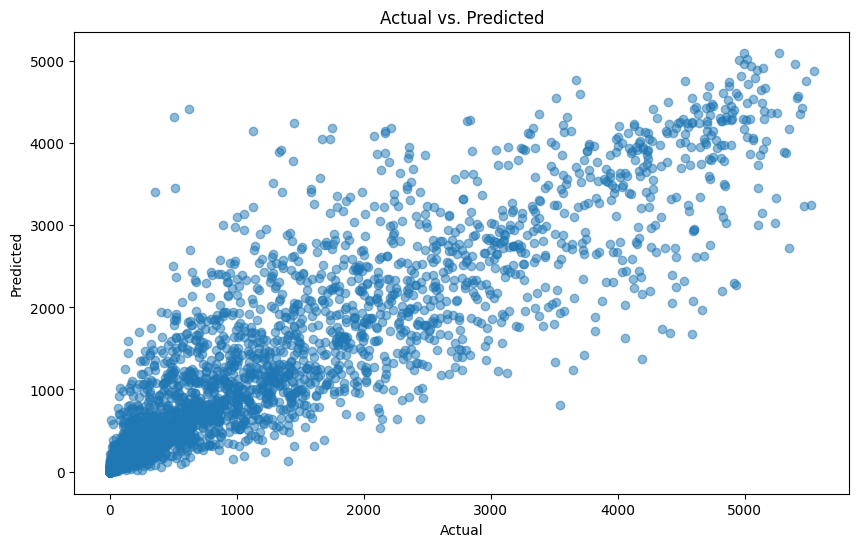

,number_of_trees,number_of_internal_trees,model_size_in_bytes,min_depth,max_depth,mean_depth,min_leaves,max_leaves,mean_leaves
,70.0,70.0,50939.0,7.0,7.0,7.0,15.0,106.0,53.285713


In [ ]:
# Inspect leaderboard
lb = aml.leaderboard

# Get the best model
best_model = aml.leader

# Make predictions
preds = best_model.predict(h2o_test)
preds_df = h2o.as_list(preds)

# Visualize predictions
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.scatter(y_test, preds_df, alpha=0.5)
plt.xlabel('Actual')
plt.ylabel('Predicted')
plt.title('Actual vs. Predicted')
plt.show()

# Inspect best model
best_model.summary()

# Decide whether to shut down the cluster
# h2o.cluster().shutdown()


In [ ]:
def check_data_compatibility(df1, df2):
    # Check if both DataFrames have the same columns
    columns_df1 = set(df1.columns)
    columns_df2 = set(df2.columns)
    if columns_df1 == columns_df2:
        print("Both DataFrames have the same columns.")
    else:
        print("Different columns in the two DataFrames.")
        print("Columns in df1 but not in df2:", columns_df1 - columns_df2)
        print("Columns in df2 but not in df1:", columns_df2 - columns_df1)

    # Check if data types match for corresponding columns
    matching_dtypes = all(df1[col].dtype == df2[col].dtype for col in columns_df1.intersection(columns_df2))
    if matching_dtypes:
        print("Data types match for all common columns.")
    else:
        print("Data types do not match for all common columns.")
        for col in columns_df1.intersection(columns_df2):
            if df1[col].dtype != df2[col].dtype:
                print(f"Column '{col}' has different data types: {df1[col].dtype} in df1 and {df2[col].dtype} in df2.")

    # Check for overlapping or non-unique indices
    if df1.index.is_unique and df2.index.is_unique:
        print("Both DataFrames have unique indices.")
    else:
        print("One or both DataFrames do not have unique indices.")
        if not df1.index.is_unique:
            print("df1 has non-unique indices.")
        if not df2.index.is_unique:
            print("df2 has non-unique indices.")

    # Check for any NaNs in the individual DataFrames before concatenation
    nan_in_df1 = df1.isna().sum().sum()
    nan_in_df2 = df2.isna().sum().sum()
    if nan_in_df1 == 0 and nan_in_df2 == 0:
        print("No NaNs in either DataFrame before concatenation.")
    else:
        print("NaNs present in one or both DataFrames before concatenation.")
        print(f"NaNs in df1: {nan_in_df1}")
        print(f"NaNs in df2: {nan_in_df2}")


In [ ]:
def print_num_na(df, df_name):
    num_na = df.isna().sum().sum()
    print(f"Number of NaNs in {df_name}: {num_na}")

In [ ]:
import pandas as pd

def prepare_location_data(X_train_observed, X_train_estimated, y_train):
    # Make copies so original dataframes remain unchanged
    X_train_observed = X_train_observed.copy()
    X_train_estimated = X_train_estimated.copy()
    y_train = y_train.copy()

    X_train_observed["type"] = "observed"
    X_train_estimated["type"] = "estimated"
    
    print_num_na(X_train_observed, 'X_train_observed')
    print_num_na(X_train_estimated, 'X_train_estimated')
    print_num_na(y_train, 'y_train')
    # Drop unnecessary columns
    X_train_cleaned = X_train_estimated.drop(columns=['date_calc'], errors='ignore')
    
    # Combine observed and estimated data
    X_train = pd.concat([X_train_observed, X_train_cleaned], ignore_index=True)
    
    # Add seasonal features
    X_train['hour_of_day'] = X_train['date_forecast'].dt.hour
    X_train['day_of_week'] = X_train['date_forecast'].dt.dayofweek
    X_train['month_of_year'] = X_train['date_forecast'].dt.month

    # Sort by 'date_forecast' and reset index
    X_train.sort_values(by='date_forecast', inplace=True)
    X_train.reset_index(drop=True, inplace=True)
    
    # Set 'date_forecast' as the index for easier resampling
    X_train.set_index('date_forecast', inplace=True)

    print_num_na(X_train, 'X_train')
    
    # Resample to hourly and aggregate using mean
    X_train_hourly = X_train.resample('H').mean()
    X_train_hourly.reset_index(inplace=True)

    # Identify missing timestamps
    start_date = y_train['time'].min()
    end_date = y_train['time'].max()
    expected_hourly_timestamps = pd.date_range(start=start_date, end=end_date, freq='H')
    
    missing_timestamps = expected_hourly_timestamps[~expected_hourly_timestamps.isin(y_train['time'])]
    
    if len(missing_timestamps) == 0:
        print(f"No missing hours in the targets for location {location}.")
    else:
        print(f"Missing hours in the targets for location {location}:")
        print(missing_timestamps)
        
        # Fill missing values with NaN
        y_train = y_train.set_index('time').reindex(expected_hourly_timestamps).reset_index()
        y_train.rename(columns={'index': 'time'}, inplace=True)

    # Merging this aggregated data with y_train on the time columns
    combined_data = pd.merge(y_train, X_train_hourly, left_on='time', right_on='date_forecast', how='outer')

    # Drop the 'date_forecast' column and change time column to "ds", aswell as the "pv_measurement" column to "y"
    combined_data.drop(columns=['date_forecast'], inplace=True)
    combined_data.rename(columns={'time': 'ds', 'pv_measurement': 'y'}, inplace=True)

    return combined_data

# Prepare data for each location
prepared_data_by_location = {}
for location in ['A', 'B', 'C']:  # Add more locations as needed
    combined_data = prepare_location_data(
        X_train_observed=data_by_location[location]['X_train_observed'],
        X_train_estimated=data_by_location[location]['X_train_estimated'],
        y_train=data_by_location[location]['y_train']
    )
    prepared_data_by_location[location] = combined_data

print(prepared_data_by_location['A'])


Number of NaNs in X_train_observed: 0
Number of NaNs in X_train_estimated: 0
Number of NaNs in y_train: 0
Number of NaNs in X_train: 0
Missing hours in the targets for location A:
DatetimeIndex(['2022-10-21 01:00:00', '2022-10-21 02:00:00',
               '2022-10-21 03:00:00', '2022-10-21 04:00:00',
               '2022-10-21 05:00:00', '2022-10-21 06:00:00',
               '2022-10-21 07:00:00', '2022-10-21 08:00:00',
               '2022-10-21 09:00:00', '2022-10-21 10:00:00',
               ...
               '2022-10-28 12:00:00', '2022-10-28 13:00:00',
               '2022-10-28 14:00:00', '2022-10-28 15:00:00',
               '2022-10-28 16:00:00', '2022-10-28 17:00:00',
               '2022-10-28 18:00:00', '2022-10-28 19:00:00',
               '2022-10-28 20:00:00', '2022-10-28 21:00:00'],
              dtype='datetime64[ns]', length=189, freq='H')
Number of NaNs in X_train_observed: 0
Number of NaNs in X_train_estimated: 0
Number of NaNs in y_train: 0
Number of NaNs in X_trai

In [ ]:

# Fix problems with column names
check_data_compatibility(X_train_observed, X_train_estimated)

print("NaNs in X_train_observed: ", X_train_observed.isna().sum().sum())
print("NaNs in X_train_estimated: ", X_train_estimated.isna().sum().sum())


# We find that "Columns in X_train_estimated but not in X_train_observed: {'date_calc'}"
# Drop it for now, maybe we can use it later, drop if exists in X_train_estimated
X_train_estimated.drop(columns=['date_calc'], inplace=True, errors='ignore')

# Combining X_train_observed and X_train_estimated into a single DataFrame called X_train
X_train = pd.concat([X_train_observed, X_train_estimated], ignore_index=True)
print("NaNs in X_train: ", X_train.isna().sum().sum())
# Sorting by 'date_forecast' to maintain chronological order
X_train.sort_values(by='date_forecast', inplace=True)
X_train.reset_index(drop=True, inplace=True)

# Adding Seasonal Features
# Extracting hour of the day, day of the week, and month of the year from 'date_forecast'
for df in [X_train, X_test_estimated]:
    df['hour_of_day'] = df['date_forecast'].dt.hour
    df['day_of_week'] = df['date_forecast'].dt.dayofweek
    df['month_of_year'] = df['date_forecast'].dt.month

Both DataFrames have the same columns.
Data types match for all common columns.
Both DataFrames have unique indices.
No NaNs in either DataFrame before concatenation.
NaNs in X_train_observed:  0
NaNs in X_train_estimated:  0
NaNs in X_train:  0


In [ ]:
print("NaNs in X_train:", X_train.isna().sum().sum())
print("NaNs in train_targets:", train_targets.isna().sum().sum())
# Setting 'date_forecast' as the index for easier resampling
X_train.set_index('date_forecast', inplace=True)

# Resampling to hourly and taking the mean
X_train_hourly = X_train.resample('H').interpolate()
print("NaNs in X_train_hourly:", X_train_hourly.isna().sum().sum())

# Resetting the index
X_train_hourly.reset_index(inplace=True)

print("Length of X_train_hourly:", len(X_train_hourly))
print("Length of train_targets:", len(train_targets))

start_date = train_targets['time'].min()
end_date = train_targets['time'].max()
print(f"Start Date targets: {start_date}")
print(f"End Date targets: {end_date}")

# Generate a list of expected hourly timestamps for the entire period
expected_hourly_timestamps = pd.date_range(start=start_date, end=end_date, freq='H')
print("Length of expected_hourly_timestamps:", len(expected_hourly_timestamps))

# Identify missing timestamps
missing_timestamps = expected_hourly_timestamps[~expected_hourly_timestamps.isin(train_targets['time'])]

if len(missing_timestamps) == 0:
    print("No missing hours in the targets.")
else:
    print("Missing hours in the targets:")
    print(missing_timestamps)
    # fill missing values with Nan
    train_targets = train_targets.set_index('time').reindex(expected_hourly_timestamps).reset_index()
    train_targets.rename(columns={'index': 'time'}, inplace=True)
    print("NaNs in train_targets:", train_targets.isna().sum().sum())








# Merging this aggregated data with train_targets on the time columns
combined_data = pd.merge(train_targets, X_train_hourly, left_on='time', right_on='date_forecast', how='outer')
print("NaNs in combined_data:", combined_data.isna().sum().sum())

NaNs in X_train: 0
NaNs in train_targets: 0


NaNs in X_train_hourly: 0
Length of X_train_hourly: 34274
Length of train_targets: 34085
Start Date targets: 2019-06-02 22:00:00
End Date targets: 2023-04-30 23:00:00
Length of expected_hourly_timestamps: 34274
Missing hours in the targets:
DatetimeIndex(['2022-10-21 01:00:00', '2022-10-21 02:00:00',
               '2022-10-21 03:00:00', '2022-10-21 04:00:00',
               '2022-10-21 05:00:00', '2022-10-21 06:00:00',
               '2022-10-21 07:00:00', '2022-10-21 08:00:00',
               '2022-10-21 09:00:00', '2022-10-21 10:00:00',
               ...
               '2022-10-28 12:00:00', '2022-10-28 13:00:00',
               '2022-10-28 14:00:00', '2022-10-28 15:00:00',
               '2022-10-28 16:00:00', '2022-10-28 17:00:00',
               '2022-10-28 18:00:00', '2022-10-28 19:00:00',
               '2022-10-28 20:00:00', '2022-10-28 21:00:00'],
              dtype='datetime64[ns]', length=189, freq='H')
NaNs in train_targets: 189
NaNs in combined_data: 189


In [ ]:

df = combined_data.copy()
# Check for NaN values in the entire DataFrame
nan_mask = df.isna().any()

# Get the columns with NaN values
columns_with_nan = df.columns[nan_mask].tolist()

# Display the columns with NaN values and the count of NaNs in each column
for col in columns_with_nan:
    nan_count = df[col].isna().sum()
    print(f"Column '{col}' has {nan_count} NaN values.")


Column 'pv_measurement' has 189 NaN values.


In [ ]:
from statsforecast.adapters.prophet import AutoARIMAProphet
from sklearn.model_selection import train_test_split
import matplotlib
# Calculate the correlation matrix
correlation_matrix = combined_data.corr()

# Extract the correlations between all features and the target variable 'pv_measurement'
feature_target_corr = correlation_matrix['pv_measurement'].sort_values(ascending=False)

# Filter features with an absolute value of correlation greater than 0.3
selected_features = feature_target_corr[feature_target_corr.abs() > 0.3].index.tolist()
selected_features.remove('pv_measurement')  # Remove the target variable itself

# Select only the relevant features from the combined training data
filtered_combined_data = combined_data[['time', 'pv_measurement'] + selected_features]

# Rename columns to fit Prophet's requirements ('ds' for date, 'y' for value to be forecasted)
filtered_prophet_data = filtered_combined_data.rename(columns={'time': 'ds', 'pv_measurement': 'y'})

# 80-20 split for training and testing
train_filtered, test_filtered = train_test_split(filtered_prophet_data, test_size=0.2, shuffle=False)

# Initialize and fit the Prophet model on the filtered training data
model_filtered = AutoARIMAProphet()

# Add selected features as additional regressors
for feature in selected_features:
    model_filtered.add_regressor(feature)

# Fit the model
model_filtered.fit(train_filtered)

/var/folders/zz/50jdxpms0512wj_qt0tzxqlh0000gn/T/ipykernel_20629/1620613725.py:3: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  correlation_matrix = combined_data.corr()
/opt/homebrew/anaconda3/lib/python3.9/site-packages/scipy/optimize/_numdiff.py:576: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/opt/homebrew/anaconda3/lib/python3.9/site-packages/scipy/optimize/_numdiff.py:576: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/opt/homebrew/anaconda3/lib/python3.9/site-packages/scipy/optimize/_numdiff.py:576: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/opt/homebrew/anaconda3/lib/python3.9/site-packages/scipy/optimize/_numdiff.py:576: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/opt/homebrew/anaconda3/lib/p

NaNs in filtered_prophet_data: 0


/var/folders/zz/50jdxpms0512wj_qt0tzxqlh0000gn/T/ipykernel_20629/3976730509.py:3: FutureWarning: DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.
  filtered_prophet_data.fillna(filtered_prophet_data.median(), inplace=True)


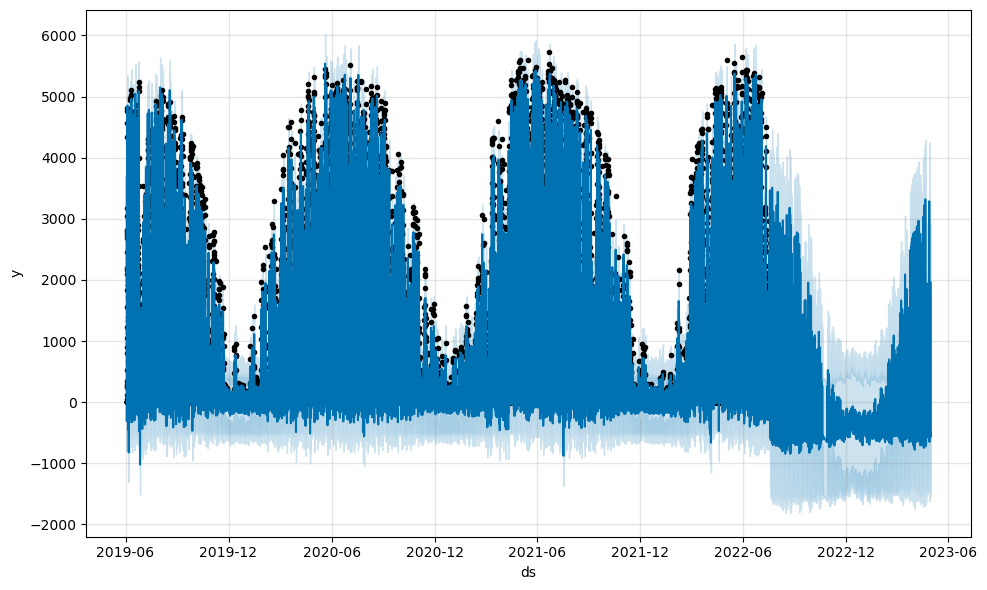

In [ ]:
print("NaNs in filtered_prophet_data:", filtered_prophet_data.isna().sum().sum())
# Fill NaNs with column-wise median
filtered_prophet_data.fillna(filtered_prophet_data.median(), inplace=True)

# Generate the forecast using the filtered model
forecast_filtered = model_filtered.predict(filtered_prophet_data)

# Plot the forecast
fig = model_filtered.plot(forecast_filtered)

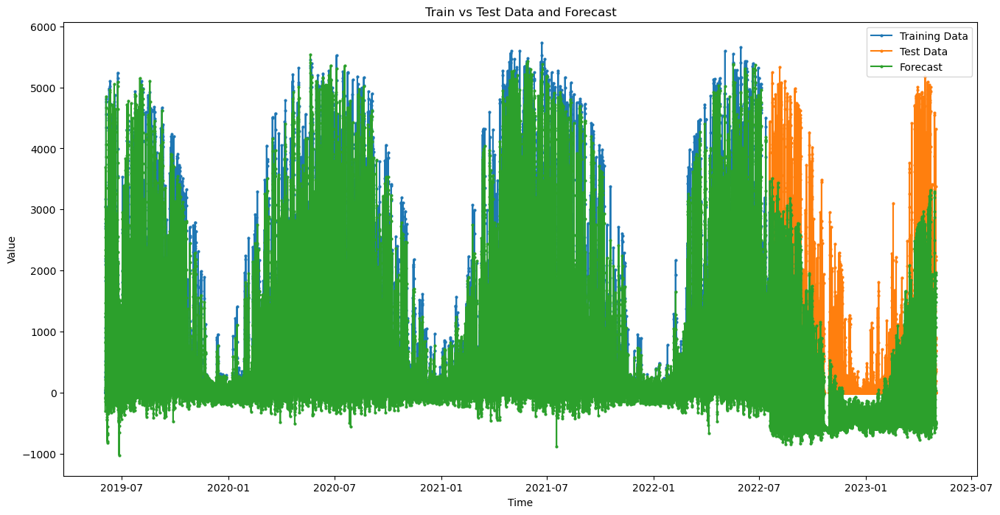

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd

# Convert the time column back to datetime for plotting
train_filtered['ds'] = pd.to_datetime(train_filtered['ds'])
test_filtered['ds'] = pd.to_datetime(test_filtered['ds'])
forecast_filtered['ds'] = pd.to_datetime(forecast_filtered['ds'])

# Create the plot
plt.figure(figsize=(16, 8))

# Plot the training data
plt.plot(train_filtered['ds'], train_filtered['y'], label='Training Data', linestyle='-', marker='o', markersize=2)

# Plot the test data
plt.plot(test_filtered['ds'], test_filtered['y'], label='Test Data', linestyle='-', marker='o', markersize=2)

# Plot the forecasted data
plt.plot(forecast_filtered['ds'], forecast_filtered['yhat'], label='Forecast', linestyle='-', marker='o', markersize=2)

# Show legend
plt.legend()

# Set labels and title
plt.xlabel('Time')
plt.ylabel('Value')
plt.title('Train vs Test Data and Forecast')

# Show the plot
plt.show()



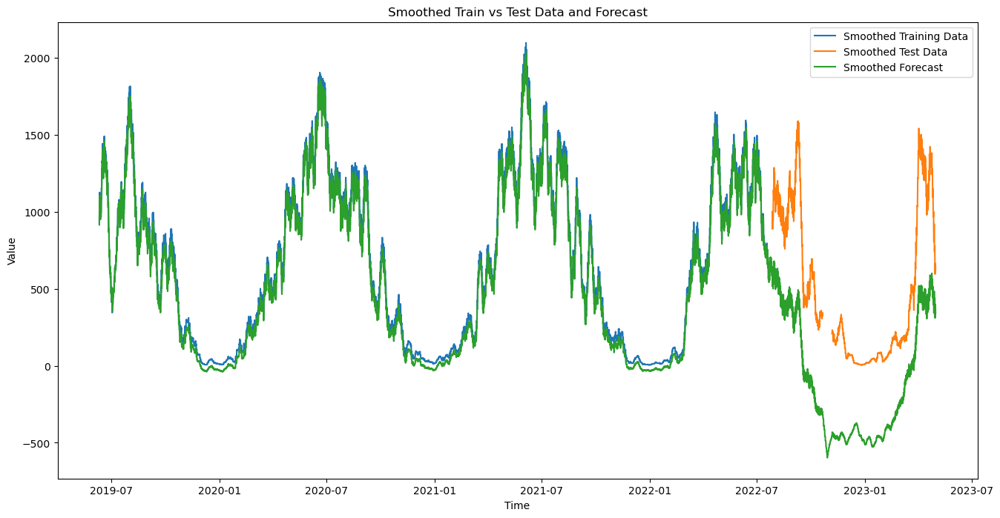

In [ ]:

n = 200 
train_filtered['y_moving_avg'] = train_filtered['y'].rolling(window=n).mean()
test_filtered['y_moving_avg'] = test_filtered['y'].rolling(window=n).mean()
forecast_filtered['yhat_moving_avg'] = forecast_filtered['yhat'].rolling(window=n).mean()

# Plot the smoothed data
plt.figure(figsize=(16, 8))
plt.plot(train_filtered['ds'], train_filtered['y_moving_avg'], label='Smoothed Training Data')
plt.plot(test_filtered['ds'], test_filtered['y_moving_avg'], label='Smoothed Test Data')
plt.plot(forecast_filtered['ds'], forecast_filtered['yhat_moving_avg'], label='Smoothed Forecast')
plt.legend()
plt.xlabel('Time')
plt.ylabel('Value')
plt.title('Smoothed Train vs Test Data and Forecast')
plt.show()


# Lets try a neural model from neuralforecast

In [ ]:
!pip install neuralforecast torch uuid

  Using cached uuid-1.30-py3-none-any.whl


In [ ]:
from neuralforecast import NeuralForecast
from neuralforecast.models import NBEATS, NBEATSx
from sklearn.model_selection import train_test_split

# Prepare the data
# Assuming 'train_targets' DataFrame has columns ['time', 'pv_measurement']
y_train = train_targets.copy()
y_train.rename(columns={'time': 'ds', 'pv_measurement': 'y'}, inplace=True)
y_train['unique_id'] = 1

print(y_train.head())

# 80-20 split for training and testing
train_df, test_df = train_test_split(y_train, test_size=0.3, shuffle=False)

# Initialize and fit the NBEATS model
# We'll assume a horizon of 24 (i.e., we want to forecast 24 hours into the future)
horizon = 24
nbeats_model = NBEATSx(horizon)
nf = NeuralForecast(models=[nbeats_model], freq='H')

# Fit the model
nf.fit(df=train_df)


Global seed set to 1


                   ds      y  unique_id
0 2019-06-02 22:00:00   0.00          1
1 2019-06-02 23:00:00   0.00          1
2 2019-06-03 00:00:00   0.00          1
3 2019-06-03 01:00:00   0.00          1
4 2019-06-03 02:00:00  19.36          1
Epoch 99: 100%|██████████| 1/1 [00:00<00:00, 19.40it/s, v_num=15, train_loss_step=288.0, train_loss_epoch=288.0]


In [ ]:
print(nbeats_model)

NBEATS


In [ ]:
def _future_dates(dataset, uids, last_dates, freq, h):
    """
    Generate future dates for `predict` function.
    """
    if issubclass(last_dates.dtype.type, np.integer):
        last_date_f = lambda x: np.arange(x + 1, x + 1 + h, dtype=last_dates.dtype)
    else:
        last_date_f = lambda x: pd.date_range(x + freq, periods=h, freq=freq)
    if len(np.unique(last_dates)) == 1:
        dates = np.tile(last_date_f(last_dates[0]), len(dataset))
    else:
        dates = np.hstack([last_date_f(last_date) for last_date in last_dates])
    idx = pd.Index(np.repeat(uids, h), name="unique_id")
    df = pd.DataFrame({"ds": dates}, index=idx)
    return df

# Make predictions
# Initialize a dictionary to keep the most recent prediction for each time stamp
latest_predictions = {}

# Total length of the test data
total_length = len(test_df)

#print(train_df)

# Loop through the test data
for i in range(total_length - horizon):
    # Log the current progress
    if i % 10 == 0:  # Change 10 to any other number to adjust the logging frequency
        print(f"Processing index {i} out of {total_length}")

    # Extract the future_window_df directly from test_df
    future_window_df = test_df.iloc[i:i+horizon].drop(columns=['y'])
    
    # Make the 24-hour future prediction for that point
    print(future_window_df.shape[0])
    fcsts_df = _future_dates(
        dataset=nf.dataset, uids=nf.uids, last_dates=nf.last_dates, freq=nf.freq, h=nf.h
    )
    print(fcsts_df.shape[0])
    print(fcsts_df,"My future: ", future_window_df)
    print("HEI")
    print(nf.last_dates)
    future_prediction = nf.predict(futr_df=future_window_df).reset_index()
    
    # Update the most recent prediction for each time stamp
    for index, row in future_prediction.iterrows():
        timestamp = row['ds']  
        value = row['NBEATS']  
        latest_predictions[timestamp] = value

# Convert the latest_predictions dictionary to a DataFrame
final_predictions_df = pd.DataFrame(list(latest_predictions.items()), columns=['ds', 'y'])

# Final log statement
print("Processing complete.")

# predictions_df = nf.predict_insample(step_size=1).reset_index()
# future_predictions_df = nf.predict(futr_df=test_df).reset_index()

# # The predictions_df will contain the forecasted values
# print(test_df)
# future_predictions_df

Processing index 0 out of 10283
24
24
                           ds
unique_id                    
1         2022-02-26 13:00:00
1         2022-02-26 14:00:00
1         2022-02-26 15:00:00
1         2022-02-26 16:00:00
1         2022-02-26 17:00:00
1         2022-02-26 18:00:00
1         2022-02-26 19:00:00
1         2022-02-26 20:00:00
1         2022-02-26 21:00:00
1         2022-02-26 22:00:00
1         2022-02-26 23:00:00
1         2022-02-27 00:00:00
1         2022-02-27 01:00:00
1         2022-02-27 02:00:00
1         2022-02-27 03:00:00
1         2022-02-27 04:00:00
1         2022-02-27 05:00:00
1         2022-02-27 06:00:00
1         2022-02-27 07:00:00
1         2022-02-27 08:00:00
1         2022-02-27 09:00:00
1         2022-02-27 10:00:00
1         2022-02-27 11:00:00
1         2022-02-27 12:00:00 My future:                         ds  unique_id
23991 2022-02-26 13:00:00          1
23992 2022-02-26 14:00:00          1
23993 2022-02-26 15:00:00          1
23994 2022-02-26 16:00

ValueError: `futr_df` must have one row per id and ds in the forecasting horizon (24).

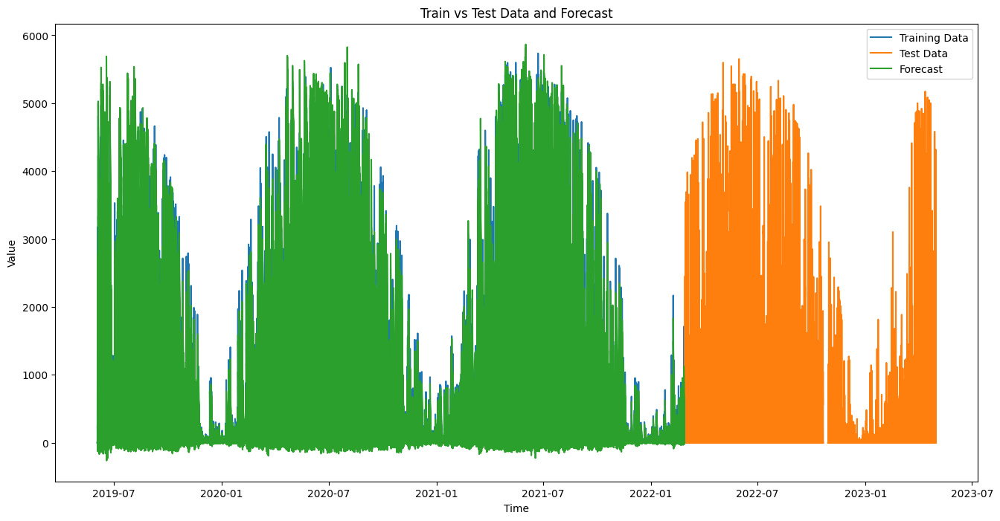

In [ ]:
# Plot the forecast
plt.figure(figsize=(16, 8))
plt.plot(train_df['ds'], train_df['y'], label='Training Data')
plt.plot(test_df['ds'], test_df['y'], label='Test Data')
plt.plot(validate_df['ds'], validate_df['y'], label='Forecast')
plt.legend()
plt.xlabel('Time')
plt.ylabel('Value')
plt.title('Train vs Test Data and Forecast')
plt.show()


In [ ]:
import numpy as np
import pandas as pd
import pytorch_lightning as pl
import matplotlib.pyplot as plt

from neuralforecast import NeuralForecast
from neuralforecast.models import MLP
from neuralforecast.losses.pytorch import MQLoss, DistributionLoss
from neuralforecast.tsdataset import TimeSeriesDataset
from neuralforecast.utils import AirPassengers, AirPassengersPanel, AirPassengersStatic

Y_train_df = AirPassengersPanel[AirPassengersPanel.ds<AirPassengersPanel['ds'].values[-12]] # 132 train
Y_test_df = AirPassengersPanel[AirPassengersPanel.ds>=AirPassengersPanel['ds'].values[-12]].reset_index(drop=True) # 12 test

model = MLP(h=12, input_size=24,
            loss=DistributionLoss(distribution='Normal', level=[80, 90]),
            scaler_type='robust',
            learning_rate=1e-3,
            max_steps=200,
            val_check_steps=10,
            early_stop_patience_steps=2)

fcst = NeuralForecast(
    models=[model],
    freq='M'
)
fcst.fit(df=Y_train_df, static_df=AirPassengersStatic, val_size=12)
forecasts = fcst.predict(futr_df=Y_test_df)

Y_hat_df = forecasts.reset_index(drop=False).drop(columns=['unique_id','ds'])
plot_df = pd.concat([Y_test_df, Y_hat_df], axis=1)
plot_df = pd.concat([Y_train_df, plot_df])

plot_df = plot_df[plot_df.unique_id=='Airline1'].drop('unique_id', axis=1)
plt.plot(plot_df['ds'], plot_df['y'], c='black', label='True')
plt.plot(plot_df['ds'], plot_df['MLP-median'], c='blue', label='median')
plt.fill_between(x=plot_df['ds'][-12:], 
                 y1=plot_df['MLP-lo-90'][-12:].values, 
                 y2=plot_df['MLP-hi-90'][-12:].values,
                 alpha=0.4, label='level 90')
plt.grid()
plt.legend()
plt.plot()

Global seed set to 1


Sanity Checking DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]

NotImplementedError: The operator 'aten::nanmedian.dim_values' is not currently implemented for the MPS device. If you want this op to be added in priority during the prototype phase of this feature, please comment on https://github.com/pytorch/pytorch/issues/77764. As a temporary fix, you can set the environment variable `PYTORCH_ENABLE_MPS_FALLBACK=1` to use the CPU as a fallback for this op. WARNING: this will be slower than running natively on MPS.